https://data.montgomerycountymd.gov/Public-Safety/Traffic-Violations/4mse-ku6q/about_data

In [1]:
import numpy as np
import pandas as pd
from scipy import stats
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import seaborn as sns


pd.set_option('display.max_columns', None)

In [2]:
df = pd.read_csv('data/Traffic_Violations.csv', parse_dates=['Date Of Stop'])
df.head()

,SeqID,Date Of Stop,Time Of Stop,Agency,SubAgency,Description,Location,Latitude,Longitude,Accident,Belts,Personal Injury,Property Damage,Fatal,Commercial License,HAZMAT,Commercial Vehicle,Alcohol,Work Zone,Search Conducted,Search Disposition,Search Outcome,Search Reason,Search Reason For Stop,Search Type,Search Arrest Reason,State,VehicleType,Year,Make,Model,Color,Violation Type,Charge,Article,Contributed To Accident,Race,Gender,Driver City,Driver State,DL State,Arrest Type,Geolocation
0,52282e8c-f2e1-4bb5-8509-2d5e4f8da8ca,2023-05-01,23:11:00,MCP,"3rd District, Silver Spring",OPERATING UNREGISTERED MOTOR VEHICLE ON HIGHWAY,BRIGGS CHANEY RD @ COLUMIBA PIKE,0.000000,0.00000,No,No,No,No,No,No,No,No,No,No,No,NaN,Citation,NaN,17-107(a1),NaN,NaN,MD,02 - Automobile,2007.0,CHEV,CRUZ,BLACK,Citation,13-401(b1),Transportation Article,False,WHITE,M,GAITHERSBURG,MD,MD,A - Marked Patrol,"(0.0, 0.0)"
1,b66f253b-af29-4bc4-bb73-93755ca2a779,2023-08-31,16:41:00,MCP,"6th District, Gaithersburg / Montgomery Village",DRIVING TO DRIVE MOTOR VEHICLE ON HIGHWAY WITH...,OAKMONT AVE @ GROVEMONT CIR,39.097965,-77.15301,No,No,No,No,No,No,No,No,No,No,No,NaN,Citation,NaN,20-102(a1),NaN,NaN,MD,02 - Automobile,2005.0,FORD,EXPLORER,BLACK,Citation,16-101(a1),Transportation Article,False,HISPANIC,M,GAITHERSBURG,MD,MD,A - Marked Patrol,"(39.097965, -77.15301)"
2,b66f253b-af29-4bc4-bb73-93755ca2a779,2023-08-31,16:41:00,MCP,"6th District, Gaithersburg / Montgomery Village",FAILURE TO DISPLAY REGISTRATION CARD UPON DEMA...,OAKMONT AVE @ GROVEMONT CIR,39.097965,-77.15301,No,No,No,No,No,No,No,No,No,No,No,NaN,Citation,NaN,20-102(a1),NaN,NaN,MD,02 - Automobile,2005.0,FORD,EXPLORER,BLACK,Citation,13-409(b),Transportation Article,False,HISPANIC,M,GAITHERSBURG,MD,MD,A - Marked Patrol,"(39.097965, -77.15301)"
3,b66f253b-af29-4bc4-bb73-93755ca2a779,2023-08-31,16:41:00,MCP,"6th District, Gaithersburg / Montgomery Village",DRIVER OF MOTOR VEHICLE FOLLOWING VEHICLE CLOS...,OAKMONT AVE @ GROVEMONT CIR,39.097965,-77.15301,No,No,No,No,No,No,No,No,No,No,No,NaN,Citation,NaN,20-102(a1),NaN,NaN,MD,02 - Automobile,2005.0,FORD,EXPLORER,BLACK,Citation,21-310(a),Transportation Article,False,HISPANIC,M,GAITHERSBURG,MD,MD,A - Marked Patrol,"(39.097965, -77.15301)"
4,b66f253b-af29-4bc4-bb73-93755ca2a779,2023-08-31,16:41:00,MCP,"6th District, Gaithersburg / Montgomery Village",FAILURE TO CONTROL VEH. SPEED ON HWY. TO AVOID...,OAKMONT AVE @ GROVEMONT CIR,39.097965,-77.15301,No,No,No,No,No,No,No,No,No,No,No,NaN,Citation,NaN,20-102(a1),NaN,NaN,MD,02 - Automobile,2005.0,FORD,EXPLORER,BLACK,Citation,21-801(b),Transportation Article,False,HISPANIC,M,GAITHERSBURG,MD,MD,A - Marked Patrol,"(39.097965, -77.15301)"


In [3]:
df.isna().sum()

SeqID                            0
Date Of Stop                     0
Time Of Stop                     0
Agency                           0
SubAgency                        0
Description                     10
Location                         5
Latitude                         0
Longitude                        0
Accident                         0
Belts                            0
Personal Injury                  0
Property Damage                  0
Fatal                            0
Commercial License               0
HAZMAT                           0
Commercial Vehicle               0
Alcohol                          0
Work Zone                        0
Search Conducted            794729
Search Disposition         2006107
Search Outcome              814020
Search Reason              2006107
Search Reason For Stop      795032
Search Type                2006115
Search Arrest Reason       2033763
State                           59
VehicleType                      0
Year                

In [4]:
df.nunique()

SeqID                      1193874
Date Of Stop                  5172
Time Of Stop                  1440
Agency                           1
SubAgency                        9
Description                  18007
Location                    272062
Latitude                    400092
Longitude                   445003
Accident                         2
Belts                            2
Personal Injury                  2
Property Damage                  2
Fatal                            2
Commercial License               2
HAZMAT                           2
Commercial Vehicle               2
Alcohol                          2
Work Zone                        2
Search Conducted                 2
Search Disposition               7
Search Outcome                   5
Search Reason                   10
Search Reason For Stop         845
Search Type                      6
Search Arrest Reason            11
State                           72
VehicleType                     36
Year                

In [5]:
df = df.drop(columns=['SeqID', 'Description', 'Description', 
                      'Location', 'Geolocation', 'Model', 
                      'Search Disposition', 'Search Reason', 
                      'Search Type', 'Search Arrest Reason',
                      'Make', 'Driver City', 'Charge'])
df.head()

,Date Of Stop,Time Of Stop,Agency,SubAgency,Latitude,Longitude,Accident,Belts,Personal Injury,Property Damage,Fatal,Commercial License,HAZMAT,Commercial Vehicle,Alcohol,Work Zone,Search Conducted,Search Outcome,Search Reason For Stop,State,VehicleType,Year,Color,Violation Type,Article,Contributed To Accident,Race,Gender,Driver State,DL State,Arrest Type
0,2023-05-01,23:11:00,MCP,"3rd District, Silver Spring",0.000000,0.00000,No,No,No,No,No,No,No,No,No,No,No,Citation,17-107(a1),MD,02 - Automobile,2007.0,BLACK,Citation,Transportation Article,False,WHITE,M,MD,MD,A - Marked Patrol
1,2023-08-31,16:41:00,MCP,"6th District, Gaithersburg / Montgomery Village",39.097965,-77.15301,No,No,No,No,No,No,No,No,No,No,No,Citation,20-102(a1),MD,02 - Automobile,2005.0,BLACK,Citation,Transportation Article,False,HISPANIC,M,MD,MD,A - Marked Patrol
2,2023-08-31,16:41:00,MCP,"6th District, Gaithersburg / Montgomery Village",39.097965,-77.15301,No,No,No,No,No,No,No,No,No,No,No,Citation,20-102(a1),MD,02 - Automobile,2005.0,BLACK,Citation,Transportation Article,False,HISPANIC,M,MD,MD,A - Marked Patrol
3,2023-08-31,16:41:00,MCP,"6th District, Gaithersburg / Montgomery Village",39.097965,-77.15301,No,No,No,No,No,No,No,No,No,No,No,Citation,20-102(a1),MD,02 - Automobile,2005.0,BLACK,Citation,Transportation Article,False,HISPANIC,M,MD,MD,A - Marked Patrol
4,2023-08-31,16:41:00,MCP,"6th District, Gaithersburg / Montgomery Village",39.097965,-77.15301,No,No,No,No,No,No,No,No,No,No,No,Citation,20-102(a1),MD,02 - Automobile,2005.0,BLACK,Citation,Transportation Article,False,HISPANIC,M,MD,MD,A - Marked Patrol


In [6]:
df.nunique()

Date Of Stop                 5172
Time Of Stop                 1440
Agency                          1
SubAgency                       9
Latitude                   400092
Longitude                  445003
Accident                        2
Belts                           2
Personal Injury                 2
Property Damage                 2
Fatal                           2
Commercial License              2
HAZMAT                          2
Commercial Vehicle              2
Alcohol                         2
Work Zone                       2
Search Conducted                2
Search Outcome                  5
Search Reason For Stop        845
State                          72
VehicleType                    36
Year                          432
Color                          26
Violation Type                  4
Article                         6
Contributed To Accident         2
Race                            6
Gender                          3
Driver State                   68
DL State      

In [7]:
df.Accident.value_counts(normalize=True)

Accident
No     0.972642
Yes    0.027358
Name: proportion, dtype: float64

In [8]:
df['Personal Injury'].value_counts(normalize=True)

Personal Injury
No     0.987895
Yes    0.012105
Name: proportion, dtype: float64

In [9]:
df['Fatal'].value_counts(normalize=True)

Fatal
No     0.999723
Yes    0.000277
Name: proportion, dtype: float64

In [10]:
df['Commercial License'].value_counts(normalize=True)

Commercial License
No     0.972133
Yes    0.027867
Name: proportion, dtype: float64

In [11]:
df['HAZMAT'].value_counts()

HAZMAT
No     2096101
Yes        154
Name: count, dtype: int64

In [12]:
df = df.drop(columns=['Agency'])

In [13]:
df.isna().sum()

Date Of Stop                    0
Time Of Stop                    0
SubAgency                       0
Latitude                        0
Longitude                       0
Accident                        0
Belts                           0
Personal Injury                 0
Property Damage                 0
Fatal                           0
Commercial License              0
HAZMAT                          0
Commercial Vehicle              0
Alcohol                         0
Work Zone                       0
Search Conducted           794729
Search Outcome             814020
Search Reason For Stop     795032
State                          59
VehicleType                     0
Year                        10660
Color                       22363
Violation Type                  0
Article                     93802
Contributed To Accident         0
Race                            0
Gender                          0
Driver State                   11
DL State                      929
Arrest Type   

In [14]:
df.Year.describe()

count    2.085595e+06
mean     2.007720e+03
std      8.472727e+01
min      0.000000e+00
25%      2.003000e+03
50%      2.008000e+03
75%      2.013000e+03
max      9.999000e+03
Name: Year, dtype: float64

In [15]:
df[(df.Year > 2026) | (df.Year < 1945)] 

,Date Of Stop,Time Of Stop,SubAgency,Latitude,Longitude,Accident,Belts,Personal Injury,Property Damage,Fatal,Commercial License,HAZMAT,Commercial Vehicle,Alcohol,Work Zone,Search Conducted,Search Outcome,Search Reason For Stop,State,VehicleType,Year,Color,Violation Type,Article,Contributed To Accident,Race,Gender,Driver State,DL State,Arrest Type
72,2023-08-30,19:08:00,"4th District, Wheaton",0.000000,0.000000,No,No,No,No,No,No,No,No,No,No,NaN,NaN,NaN,XX,02 - Automobile,0.0,BLACK,Citation,Transportation Article,False,HISPANIC,M,MD,MD,A - Marked Patrol
73,2023-08-30,19:08:00,"4th District, Wheaton",0.000000,0.000000,No,No,No,No,No,No,No,No,No,No,NaN,NaN,NaN,XX,02 - Automobile,0.0,BLACK,Citation,Transportation Article,False,HISPANIC,M,MD,MD,A - Marked Patrol
74,2023-08-30,19:08:00,"4th District, Wheaton",0.000000,0.000000,No,No,No,No,No,No,No,No,No,No,NaN,NaN,NaN,XX,02 - Automobile,0.0,BLACK,Citation,Transportation Article,False,HISPANIC,M,MD,MD,A - Marked Patrol
75,2023-08-30,19:08:00,"4th District, Wheaton",0.000000,0.000000,No,No,No,No,No,No,No,No,No,No,NaN,NaN,NaN,XX,02 - Automobile,0.0,BLACK,Citation,Transportation Article,False,HISPANIC,M,MD,MD,A - Marked Patrol
76,2023-08-30,19:08:00,"4th District, Wheaton",0.000000,0.000000,No,No,No,No,No,No,No,No,No,No,NaN,NaN,NaN,XX,02 - Automobile,0.0,BLACK,Citation,Transportation Article,False,HISPANIC,M,MD,MD,A - Marked Patrol
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2091084,2026-02-13,10:17:00,"4th District, Wheaton",38.963597,-77.089737,No,No,No,No,No,No,No,No,No,No,No,Warning,21-707(a),MD,02 - Automobile,0.0,"GREEN, DK",Warning,Transportation Article,False,WHITE,F,MD,MD,A - Marked Patrol
2091271,2026-02-11,16:28:00,"5th District, Germantown",39.182879,-77.258363,No,No,No,No,No,No,No,No,No,No,No,Warning,13-411(f),MD,02 - Automobile,2911.0,BLACK,Warning,Transportation Article,False,HISPANIC,M,MD,MD,A - Marked Patrol
2093126,2026-02-18,13:30:00,Headquarters and Special Operations,39.057458,-77.159762,No,No,No,No,No,No,No,No,No,No,NaN,NaN,NaN,DC,02 - Automobile,1900.0,SILVER,Warning,Transportation Article,False,OTHER,M,MD,MD,A - Marked Patrol
2094184,2026-02-24,08:14:00,Headquarters and Special Operations,39.096517,-77.154608,No,No,No,No,No,No,No,No,No,No,NaN,NaN,NaN,MD,02 - Automobile,1900.0,WHITE,Warning,Transportation Article,False,BLACK,F,MD,MD,A - Marked Patrol


Есть, вероятно, проверочные данные (проверяли работу системы учета нарушений), есть данные где год производства машины 9999 и тд. Но удалять эти данные не буду, т.к. просто во время нарушения может быть тяжело выяснить некоторые подробности и намеренно вводятся нереалестичные значения, при том, что остальные данные абсолютно нормальные.

In [16]:
df = df.dropna(subset=['Race', 'Gender'])

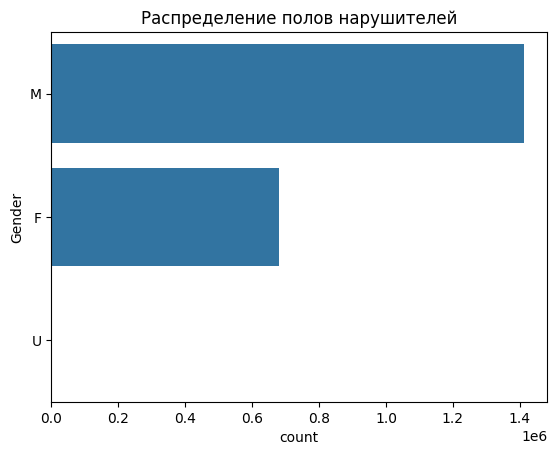

In [17]:
sns.countplot(df.Gender)
plt.title('Распределение полов нарушителей');

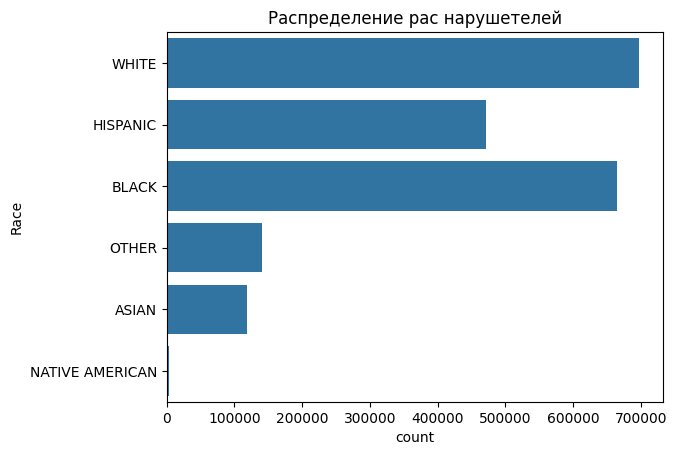

In [18]:
sns.countplot(df.Race)
plt.title('Распределение рас нарушетелей');

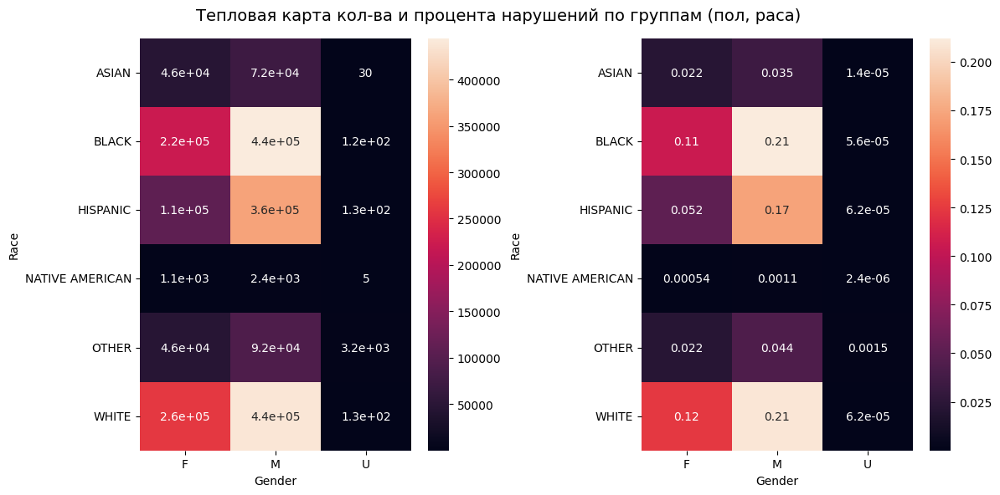

In [19]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
tmp = pd.crosstab(df.Race, df.Gender)
sns.heatmap(pd.crosstab(df.Race, df.Gender), annot=True, ax=ax[0])
sns.heatmap(pd.crosstab(df.Race, df.Gender)/df.shape[0], annot=True, ax=ax[1])
plt.suptitle('Тепловая карта кол-ва и процента нарушений по группам (пол, раса)', fontsize=14)
plt.tight_layout()

Делать выводы по этим графикам нельзя, как и проверять гипотезы типа: "Мужчины нарушают чаще", т.к. у нас нет базовой популяции. По графикам видно, что мужчин, допустивших нарушение больше, но, вероятнее всего, и водителей-мужчин больше в популяции водителей. Поэтому дальнейшие гипотезы и проверки будут опираться на априорные данные о том, что водитель уже нарушил

In [20]:
df.Alcohol = df.Alcohol.map({'Yes': 1, 'No': 0})

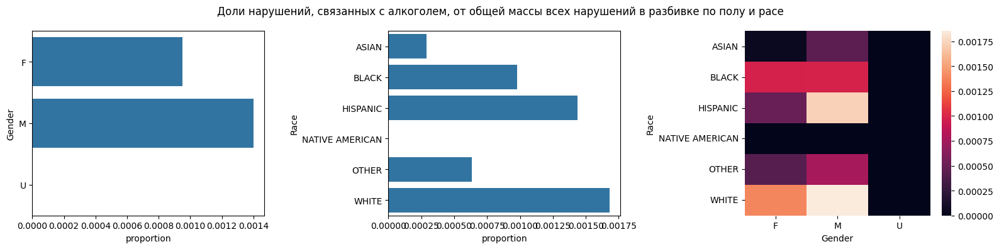

In [21]:
fig, ax = plt.subplots(1, 3, figsize=(16, 4))
sns.barplot(data=df[['Alcohol', 'Gender']].groupby('Gender').agg(proportion=('Alcohol', pd.Series.mean)), y='Gender', x='proportion', ax=ax[0])
sns.barplot(data=df[['Alcohol', 'Race']].groupby('Race').agg(proportion=('Alcohol', pd.Series.mean)), y='Race', x='proportion', ax=ax[1])
sns.heatmap(pd.pivot_table(data=df, index='Race', columns='Gender', values='Alcohol', aggfunc=pd.Series.mean), ax=ax[2])
plt.suptitle('Доли нарушений, связанных с алкоголем, от общей массы всех нарушений в разбивке по полу и расе')
plt.tight_layout()

H0: Доля выпивших нарушителей среди мужчин = доле среди женщин

H1: Доли статзначимо отличаются


In [22]:
def cramers_v(ct, chi2):
    n = ct.sum().sum()
    r, k = ct.shape
    cramers_v = np.sqrt((chi2/n) / min(k-1, r-1))
    return cramers_v

gender = df[df.Gender.isin(['M', 'F'])]
ct = pd.crosstab(gender.Alcohol, gender.Gender)
chi2, p, dof, expected = stats.chi2_contingency(ct)
cramers = cramers_v(ct, chi2)

print('chi2: ', chi2)
print('p: ', p)
print('cranmers_v: ', cramers)
pd.crosstab(gender.Gender, gender.Alcohol, normalize='index')

chi2:  73.24195847535366
p:  1.146915036308401e-17
cranmers_v:  0.005916071846029311


Alcohol,0,1
Gender,,
F,0.999049,0.000951
M,0.998601,0.001399


Различия статзначимы, Доля выпивших нарушителей среди мужчин больше, чем у женщин.
Так же видно без всяких тестов, что доли зависят от расы.

Для оценки силы связи между переменными был рассчитан коэффициент Cramér’s V. Полученное значение (V = 0.004) указывает на слабый размер эффекта. Это означает, что хотя χ²-тест может выявлять статистически значимую зависимость, влияние пола на факт употребления алкоголя в данных невелико.

In [23]:
df.Accident = df.Accident.map({'Yes': 1, 'No': 0})
df.Accident.value_counts()

Accident
0    2038906
1      57349
Name: count, dtype: int64

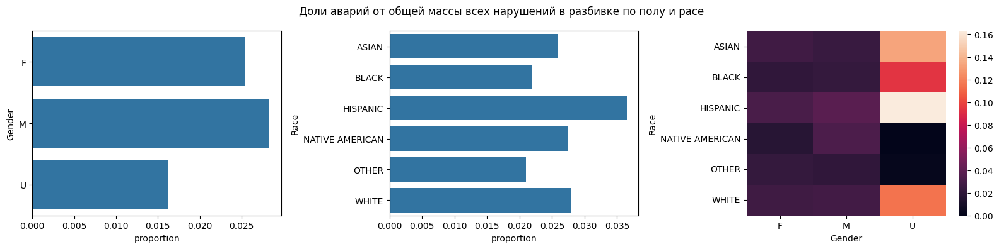

In [24]:
fig, ax = plt.subplots(1, 3, figsize=(16, 4))
sns.barplot(data=df[['Accident', 'Gender']].groupby('Gender').agg(proportion=('Accident', pd.Series.mean)), y='Gender', x='proportion', ax=ax[0])
sns.barplot(data=df[['Accident', 'Race']].groupby('Race').agg(proportion=('Accident', pd.Series.mean)), y='Race', x='proportion', ax=ax[1])
sns.heatmap(pd.pivot_table(data=df, index='Race', columns='Gender', values='Accident', aggfunc=pd.Series.mean), ax=ax[2])
plt.suptitle('Доли аварий от общей массы всех нарушений в разбивке по полу и расе')
plt.tight_layout()

Видно, что кол-во аварий у водителей неизвестного пола статзначимо ниже. Проверим гипотезу о равенстве долей между мужчинами и женщинами.

In [25]:
ct = pd.crosstab(gender.Gender, gender.Accident)
chi2, p, dof, expected = stats.chi2_contingency(ct)
cramers = cramers_v(ct, chi2)

print('chi2: ', chi2)
print('p: ', p)
print('cranmers_v: ', cramers)
pd.crosstab(gender.Gender, gender.Accident, normalize='index')

chi2:  147.31338862447333
p:  6.702292691019037e-34
cranmers_v:  0.008390243692198936


Accident,No,Yes
Gender,,
F,0.974595,0.025405
M,0.971672,0.028328


Мужчины статзначимо чаще попадают в аварии чем женщины, но размер эффекта очень слабый

Разберемся с расами. Определим, влияет ли раса на доли аварий

In [26]:
ct = pd.crosstab(df.Race, df.Accident)
chi2, p, dof, expected = stats.chi2_contingency(ct)
cramers = cramers_v(ct, chi2)

print('chi2: ', chi2)
print('p: ', p)
print('cranmers_v: ', cramers)
pd.crosstab(df.Race, df.Accident, normalize='index')

chi2:  2416.3379475381084
p:  0.0
cranmers_v:  0.03395132918289526


Accident,0,1
Race,,
ASIAN,0.974209,0.025791
BLACK,0.978000,0.022000
HISPANIC,0.963537,0.036463
NATIVE AMERICAN,0.972576,0.027424
OTHER,0.978987,0.021013
WHITE,0.972142,0.027858


In [27]:
race = df[df.Race != 'OTHER']
ct = pd.crosstab(race.Race, race.Accident)
chi2, p, dof, expected = stats.chi2_contingency(ct)
cramers = cramers_v(ct, chi2)

print('chi2: ', chi2)
print('p: ', p)
print('cranmers_v: ', cramers)
pd.crosstab(race.Race, race.Accident, normalize='index')

chi2:  2153.019724766768
p:  0.0
cranmers_v:  0.033181964172361265


Accident,0,1
Race,,
ASIAN,0.974209,0.025791
BLACK,0.978000,0.022000
HISPANIC,0.963537,0.036463
NATIVE AMERICAN,0.972576,0.027424
WHITE,0.972142,0.027858


Доля аварий зависит от расы статзначимо. Эффект очень слабый.

Heatmap на графике выше выглядит странно, скорее всего там просто у неопределенных пользователей слишком мало значений.

<Axes: xlabel='Gender', ylabel='Race'>

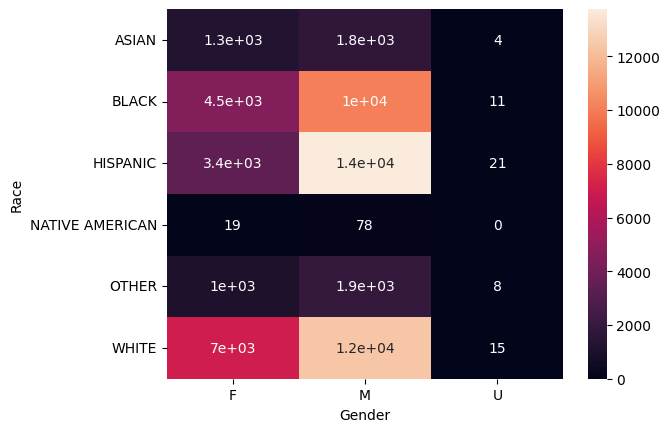

In [28]:
sns.heatmap(pd.pivot_table(data=df, index='Race', columns='Gender', values='Accident', aggfunc=pd.Series.sum), annot=True)

In [29]:
df[df.Gender == 'U'].Accident.value_counts()

Accident
0    3563
1      59
Name: count, dtype: int64

In [30]:
df.Belts = df.Belts.map({'Yes': 1, 'No': 0})
df.Belts.value_counts()

Belts
0    2031110
1      65145
Name: count, dtype: int64

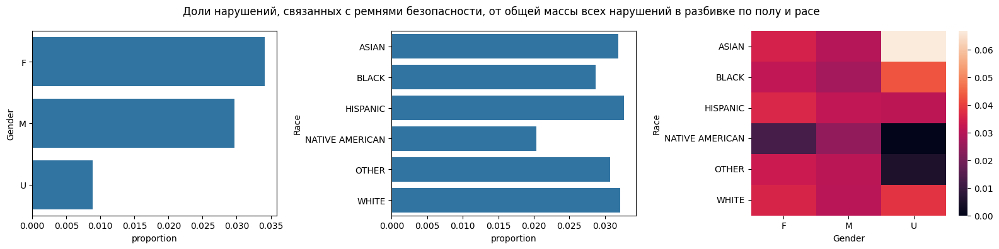

In [31]:
fig, ax = plt.subplots(1, 3, figsize=(16, 4))
sns.barplot(data=df[['Belts', 'Gender']].groupby('Gender').agg(proportion=('Belts', pd.Series.mean)), y='Gender', x='proportion', ax=ax[0])
sns.barplot(data=df[['Belts', 'Race']].groupby('Race').agg(proportion=('Belts', pd.Series.mean)), y='Race', x='proportion', ax=ax[1])
sns.heatmap(pd.pivot_table(data=df, index='Race', columns='Gender', values='Belts', aggfunc=pd.Series.mean), ax=ax[2])
plt.suptitle('Доли нарушений, связанных с ремнями безопасности, от общей массы всех нарушений в разбивке по полу и расе')
plt.tight_layout()

In [32]:
ct = pd.crosstab(gender.Race, gender.Belts)
chi2, p, dof, expected = stats.chi2_contingency(ct)
cramers = cramers_v(ct, chi2)

print('chi2: ', chi2)
print('p: ', p)
print('cranmers_v: ', cramers)
pd.crosstab(gender.Race, gender.Belts, normalize='index')

chi2:  209.2882719735744
p:  2.9226419780640497e-43
cranmers_v:  0.010000596646154032


Belts,No,Yes
Race,,
ASIAN,0.968140,0.031860
BLACK,0.971278,0.028722
HISPANIC,0.967285,0.032715
NATIVE AMERICAN,0.979615,0.020385
OTHER,0.968650,0.031350
WHITE,0.967802,0.032198


Женщины чаще НЕ пристегиваются, но эффект очень слабый.

In [33]:
ct = pd.crosstab(df.Race, df.Belts)
chi2, p, dof, expected = stats.chi2_contingency(ct)
cramers = cramers_v(ct, chi2)

print('chi2: ', chi2)
print('p: ', p)
print('cranmers_v: ', cramers)
pd.crosstab(df.Race, df.Belts, normalize='index')

chi2:  209.76756024803404
p:  2.307679481669907e-43
cranmers_v:  0.010003387855679025


Belts,0,1
Race,,
ASIAN,0.968132,0.031868
BLACK,0.971275,0.028725
HISPANIC,0.967286,0.032714
NATIVE AMERICAN,0.979644,0.020356
OTHER,0.969251,0.030749
WHITE,0.967801,0.032199


Доли пристегнувшихся тоже от расы зависят, но эффект очень слабый.

In [34]:
df.Fatal = df.Fatal.map({'Yes': 1, 'No': 0})
df.Fatal.value_counts()

Fatal
0    2095674
1        581
Name: count, dtype: int64

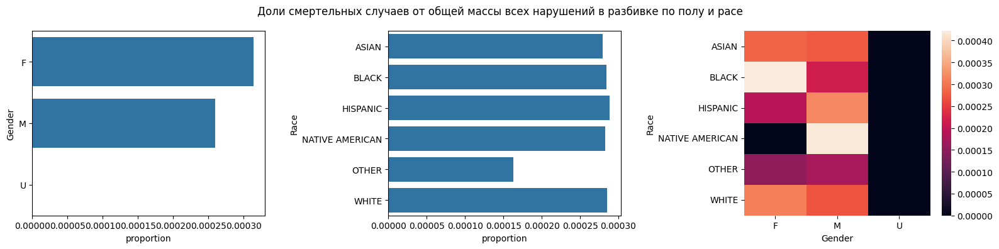

In [35]:
fig, ax = plt.subplots(1, 3, figsize=(16, 4))
sns.barplot(data=df[['Fatal', 'Gender']].groupby('Gender').agg(proportion=('Fatal', pd.Series.mean)), y='Gender', x='proportion', ax=ax[0])
sns.barplot(data=df[['Fatal', 'Race']].groupby('Race').agg(proportion=('Fatal', pd.Series.mean)), y='Race', x='proportion', ax=ax[1])
sns.heatmap(pd.pivot_table(data=df, index='Race', columns='Gender', values='Fatal', aggfunc=pd.Series.mean), ax=ax[2])
plt.suptitle('Доли смертельных случаев от общей массы всех нарушений в разбивке по полу и расе')
plt.tight_layout()

In [36]:
ct = pd.crosstab(gender.Gender, gender.Fatal)
chi2, p, dof, expected = stats.chi2_contingency(ct)
cramers = cramers_v(ct, chi2)

print('chi2: ', chi2)
print('p: ', p)
print('cranmers_v: ', cramers)
pd.crosstab(gender.Gender, gender.Fatal, normalize='index')

chi2:  4.666564437332346
p:  0.03075539206345334
cranmers_v:  0.0014933173078676325


Fatal,No,Yes
Gender,,
F,0.999686,0.000314
M,0.999740,0.000260


Женжины чаще попадают в ситуации со смертельным исходом, размер эффекта очень слабый. К тому же различия на границе стат значимости.

In [37]:
ct = pd.crosstab(df.Race, df.Fatal)
chi2, p, dof, expected = stats.chi2_contingency(ct)
cramers = cramers_v(ct, chi2)

print('chi2: ', chi2)
print('p: ', p)
print('cranmers_v: ', cramers)
pd.crosstab(df.Race, df.Fatal, normalize='index')

chi2:  7.094605434667237
p:  0.21369893451669753
cranmers_v:  0.0018396790719282482


Fatal,0,1
Race,,
ASIAN,0.999721,0.000279
BLACK,0.999716,0.000284
HISPANIC,0.999711,0.000289
NATIVE AMERICAN,0.999717,0.000283
OTHER,0.999837,0.000163
WHITE,0.999715,0.000285


Доля случаев со смертельным исходом НЕ зависит от расы. Посмотрим на обыски:


In [38]:
df['Search Conducted'] = df['Search Conducted'].fillna('No')
df['Search Conducted'] = df['Search Conducted'].map({'Yes': 1, 'No': 0})
df['Search Conducted'].value_counts()

Search Conducted
0    2006107
1      90148
Name: count, dtype: int64

Предполагается, что, если обыск был, то его обязательно в базу внесли.

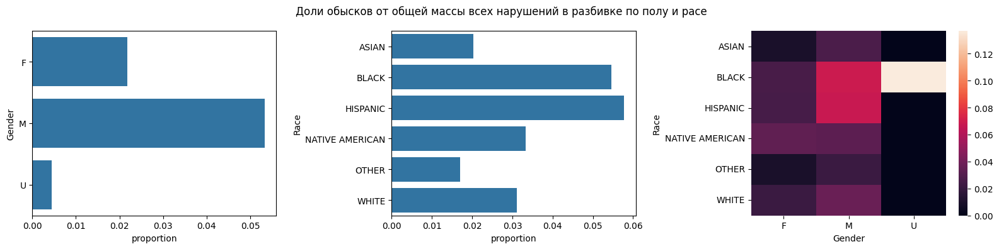

In [39]:
fig, ax = plt.subplots(1, 3, figsize=(16, 4))
sns.barplot(data=df[['Search Conducted', 'Gender']].groupby('Gender').agg(proportion=('Search Conducted', pd.Series.mean)), y='Gender', x='proportion', ax=ax[0])
sns.barplot(data=df[['Search Conducted', 'Race']].groupby('Race').agg(proportion=('Search Conducted', pd.Series.mean)), y='Race', x='proportion', ax=ax[1])
sns.heatmap(pd.pivot_table(data=df, index='Race', columns='Gender', values='Search Conducted', aggfunc=pd.Series.mean), ax=ax[2])
plt.suptitle('Доли обысков от общей массы всех нарушений в разбивке по полу и расе')
plt.tight_layout()

Видно, что мужчин обыскивают чаще в процентном соотношении

In [40]:
gender = df[df.Gender != 'U']
ct = pd.crosstab(gender.Gender, gender['Search Conducted'])
chi2, p, dof, expected = stats.chi2_contingency(ct)
cramers = cramers_v(ct, chi2)

print('chi2: ', chi2)
print('p: ', p)
print('cranmers_v: ', cramers)
pd.crosstab(gender.Gender, gender['Search Conducted'], normalize='index')

chi2:  11057.43508862184
p:  0.0
cranmers_v:  0.07269100351736588


Search Conducted,0,1
Gender,,
F,0.978174,0.021826
M,0.946677,0.053323


Различия статзначимые, но, опять же различий практически нет.

In [41]:
df.Article.value_counts()

Article
Transportation Article    1982253
Maryland Rules              20104
BR                             62
TG                             22
1A                              9
00                              3
Name: count, dtype: int64

In [42]:
df['Violation Type'].value_counts()

Violation Type
Warning     1108739
Citation     893714
ESERO         92900
SERO            902
Name: count, dtype: int64

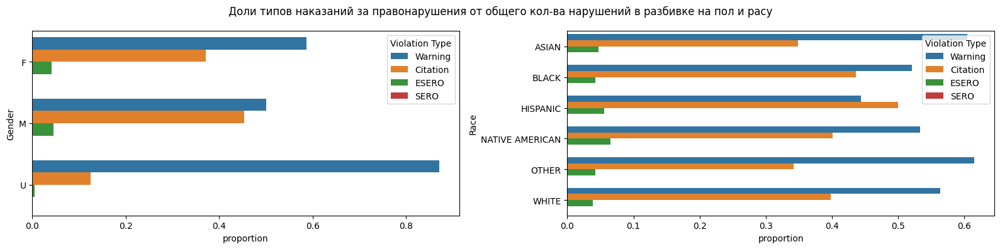

In [43]:
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
sns.barplot(data=df[['Violation Type', 'Gender']].groupby('Gender', as_index=False).value_counts(normalize=True), y='Gender', x='proportion', hue='Violation Type', ax=ax[0])
sns.barplot(data=df[['Violation Type', 'Race']].groupby('Race', as_index=False).value_counts(normalize=True), y='Race', x='proportion', hue='Violation Type', ax=ax[1])
plt.suptitle('Доли типов наказаний за правонарушения от общего кол-ва нарушений в разбивке на пол и расу')
plt.tight_layout()

Судя по графику, мужчинам чаще выписывают штрафы, проверм это:

In [44]:
tmp = df[(df['Violation Type'].isin(['Warning', 'Citation'])) & (df.Gender != 'U')]
ct = pd.crosstab(tmp.Gender, tmp['Violation Type'])
ct

Violation Type,Citation,Warning
Gender,,
F,252887,399618
M,640375,705969


In [45]:
chi2, p, dof, expected = stats.chi2_contingency(ct)
cramers = cramers_v(ct, chi2)
print('chi2: ', chi2)
print('p: ', p)
print('cranmers_v: ', cramers)
pd.crosstab(tmp.Gender, tmp['Violation Type'], normalize='index')


chi2:  13792.988103184281
p:  0.0
cranmers_v:  0.08306903917437986


Violation Type,Citation,Warning
Gender,,
F,0.387563,0.612437
M,0.475640,0.524360


In [46]:
print('odds ratio: ', (0.46/0.53) / (0.38/0.61))

odds ratio:  1.3932472691161868


Различия статзначимы. Но Крамер говорит, что глобально сами различия очень малы, хоть мужчины и получают штраы  в 1.4 раза чаще.

Проверим теперь распределение штрафов от непредвзятых автоматических средств контроля движения.

In [47]:
df['arrest_type'] = df['Arrest Type'].apply(lambda x: x.split()[0])

In [48]:
df['Arrest Type'].value_counts()

Arrest Type
A - Marked Patrol                         1676870
Q - Marked Laser                           200789
B - Unmarked Patrol                        101397
L - Motorcycle                              21063
G - Marked Moving Radar (Stationary)        20064
S - License Plate Recognition               16411
E - Marked Stationary Radar                 16352
O - Foot Patrol                             14926
R - Unmarked Laser                          11711
M - Marked (Off-Duty)                        5547
I - Marked Moving Radar (Moving)             4443
H - Unmarked Moving Radar (Stationary)       2890
F - Unmarked Stationary Radar                1085
J - Unmarked Moving Radar (Moving)           1076
C - Marked VASCAR                             548
P - Mounted Patrol                            365
N - Unmarked (Off-Duty)                       344
D - Unmarked VASCAR                           317
K - Aircraft Assist                            57
Name: count, dtype: int64

In [49]:
auto_control = df[df.arrest_type.isin(['Q', 'G', 'E', 'R', 'I', 'H', 'F', 'J', 'C', 'D', 'S'])]

Text(0.5, 1.0, 'Распределение штрафов от непредвзятых автоматических средств контроля движения в разбивке по полу')

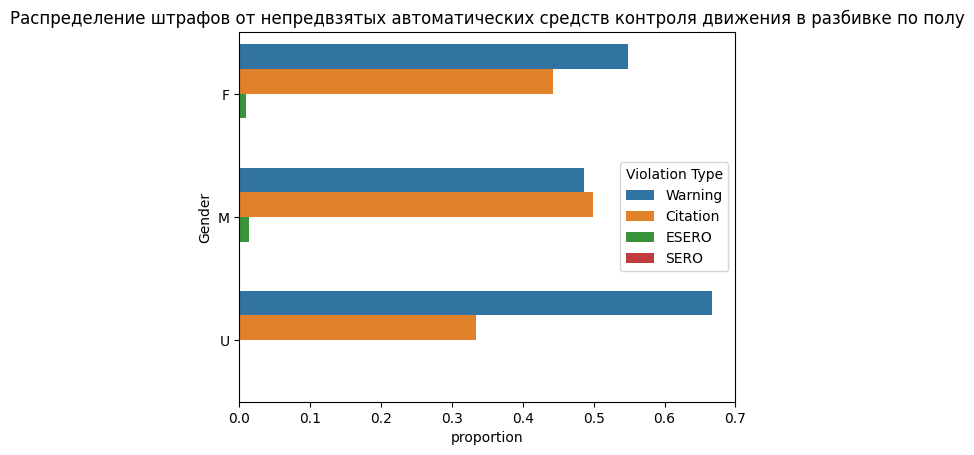

In [50]:
sns.barplot(data=auto_control[['Violation Type', 'Gender']].groupby('Gender', as_index=False).value_counts(normalize=True), y='Gender', x='proportion', hue='Violation Type')
plt.title('Распределение штрафов от непредвзятых автоматических средств контроля движения в разбивке по полу')

По графику разрыв уже не такой большой, но женщины все-таки реже получают штрафы.

In [51]:
tmp = auto_control[(auto_control['Violation Type'].isin(['Warning', 'Citation'])) & (auto_control.Gender != 'U')]
ct = pd.crosstab(tmp.Gender, tmp['Violation Type'])
ct

Violation Type,Citation,Warning
Gender,,
F,47261,58511
M,84244,82167


In [52]:
chi2, p, dof, expected = stats.chi2_contingency(ct)
cramers = cramers_v(ct, chi2)

print('chi2: ', chi2)
print('p: ', p)
print('cranmers_v: ', cramers)
pd.crosstab(tmp.Gender, tmp['Violation Type'], normalize='index')

chi2:  914.1388397743187
p:  8.283870163410936e-201
cranmers_v:  0.05795295461586471


Violation Type,Citation,Warning
Gender,,
F,0.446820,0.553180
M,0.506241,0.493759


Различия все еще статзначимые

Проверим вляние времен года на нарушения:

In [53]:
df['quarter'] = df['Date Of Stop'].dt.quarter
df['month'] = df['Date Of Stop'].dt.month
df['dow'] = df['Date Of Stop'].dt.day_name()

In [54]:
def tod(t):
    t = t.hour
    if t >= 22 or t < 6:
        return 'night'
    elif t >= 6 and t < 12:
        return 'morning'
    elif t >= 12 and t < 18:
        return 'day'
    else:
        return 'evening'

In [55]:
df['tod'] = pd.to_datetime(df['Time Of Stop']).apply(tod);

/tmp/ipykernel_15602/3948646253.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['tod'] = pd.to_datetime(df['Time Of Stop']).apply(tod);


In [56]:
tmp

,Date Of Stop,Time Of Stop,SubAgency,Latitude,Longitude,Accident,Belts,Personal Injury,Property Damage,Fatal,Commercial License,HAZMAT,Commercial Vehicle,Alcohol,Work Zone,Search Conducted,Search Outcome,Search Reason For Stop,State,VehicleType,Year,Color,Violation Type,Article,Contributed To Accident,Race,Gender,Driver State,DL State,Arrest Type,arrest_type
53,2023-04-30,02:51:00,Headquarters and Special Operations,39.182538,-77.260440,0,0,No,No,0,No,No,No,0,No,0,NaN,NaN,MD,02 - Automobile,2019.0,WHITE,Citation,Transportation Article,False,BLACK,M,MD,MD,R - Unmarked Laser,R
54,2023-04-30,03:14:00,Headquarters and Special Operations,39.184103,-77.254358,0,0,No,No,0,No,No,No,0,No,0,NaN,NaN,MD,02 - Automobile,2013.0,WHITE,Citation,Transportation Article,False,BLACK,M,MD,MD,R - Unmarked Laser,R
55,2023-04-30,03:14:00,Headquarters and Special Operations,39.184103,-77.254358,0,0,No,No,0,No,No,No,0,No,0,NaN,NaN,MD,02 - Automobile,2013.0,WHITE,Citation,Transportation Article,False,BLACK,M,MD,MD,R - Unmarked Laser,R
56,2023-04-30,03:14:00,Headquarters and Special Operations,39.184103,-77.254358,0,0,No,No,0,No,No,No,0,No,0,NaN,NaN,MD,02 - Automobile,2013.0,WHITE,Citation,Transportation Article,False,BLACK,M,MD,MD,R - Unmarked Laser,R
57,2023-04-30,03:14:00,Headquarters and Special Operations,39.184103,-77.254358,0,0,No,No,0,No,No,No,0,No,0,NaN,NaN,MD,02 - Automobile,2013.0,WHITE,Citation,Transportation Article,False,BLACK,M,MD,MD,R - Unmarked Laser,R
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2095634,2026-02-27,23:10:00,Headquarters and Special Operations,38.996370,-77.096417,0,0,No,No,0,No,No,No,0,No,0,NaN,NaN,MD,02 - Automobile,2026.0,NaN,Warning,Transportation Article,False,OTHER,F,MD,MD,I - Marked Moving Radar (Moving),I
2095659,2026-02-27,10:33:00,"1st District, Rockville",39.175478,-77.203642,0,0,No,No,0,No,No,No,0,No,0,NaN,NaN,MD,02 - Automobile,2018.0,GRAY,Warning,Transportation Article,False,HISPANIC,M,MD,MD,Q - Marked Laser,Q
2095660,2026-02-27,10:39:00,"1st District, Rockville",39.176305,-77.203378,0,0,No,No,0,No,No,No,0,No,0,NaN,NaN,MD,02 - Automobile,2005.0,SILVER,Warning,Transportation Article,False,HISPANIC,M,MD,MD,Q - Marked Laser,Q
2095661,2026-02-27,10:49:00,"1st District, Rockville",39.174817,-77.203733,0,0,No,No,0,No,No,No,0,No,0,NaN,NaN,MD,02 - Automobile,2020.0,WHITE,Warning,Transportation Article,False,WHITE,F,MD,MD,Q - Marked Laser,Q


Text(0.5, 1.0, 'Распределение кол-ва нарушений по кварталам года')

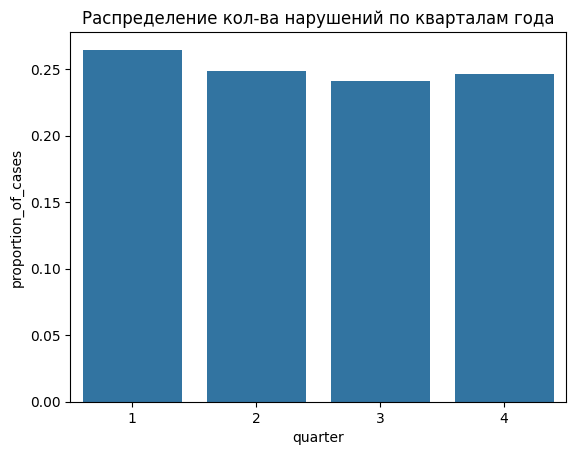

In [57]:
tmp = df.groupby('quarter', as_index=False).agg(proportion_of_cases=('Latitude', pd.Series.count))
tmp.proportion_of_cases = tmp.proportion_of_cases / len(df)
sns.barplot(tmp, x='quarter', y='proportion_of_cases')
plt.title('Распределение кол-ва нарушений по кварталам года')

H0: нарушения равномерно распределены по квартилям года

In [58]:
ct = df['quarter'].value_counts().sort_index()
chi2, p = stats.chisquare(ct)

n = ct.sum()
cohens_w = np.sqrt(chi2 / n)

print('chi2:, ', chi2)
print('p: ', p)
print('cohens_w: ', cohens_w)
ct/ct.sum()

chi2:,  2621.0308359431465
p:  0.0
cohens_w:  0.035360142736315166


quarter
1    0.264525
2    0.248550
3    0.240814
4    0.246111
Name: count, dtype: float64

Хоть различия и статзначимые, но эффект очень слабый.

Text(0.5, 1.0, 'Распределение кол-ва нарушейний по месяцам года')

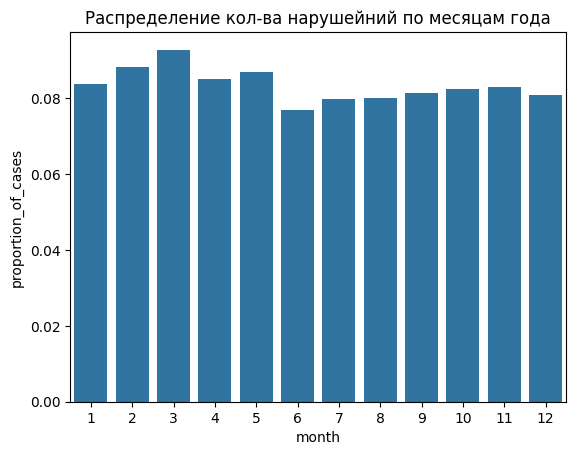

In [59]:
tmp = df.groupby('month', as_index=False).agg(proportion_of_cases=('Latitude', pd.Series.count))
tmp.proportion_of_cases = tmp.proportion_of_cases / len(df)
sns.barplot(tmp, x='month', y='proportion_of_cases')
plt.title('Распределение кол-ва нарушейний по месяцам года')

H0: нарушения равномерно распределены по месяцам

In [60]:
ct = df['month'].value_counts().sort_index()
chi2, p = stats.chisquare(ct)

n = ct.sum()
cohens_w = np.sqrt(chi2 / n)

print('chi2:, ', chi2)
print('p: ', p)
print('cohens_w: ', cohens_w)
ct/ct.sum()

chi2:,  5197.554440180227
p:  0.0
cohens_w:  0.04979405190841989


month
1     0.083661
2     0.088146
3     0.092719
4     0.085019
5     0.086782
6     0.076749
7     0.079675
8     0.079915
9     0.081223
10    0.082462
11    0.082908
12    0.080741
Name: count, dtype: float64

Статзначимые различия и очень слабый эффект

Text(0.5, 1.0, 'Распределение кол-ва нарушейний по дням недели')

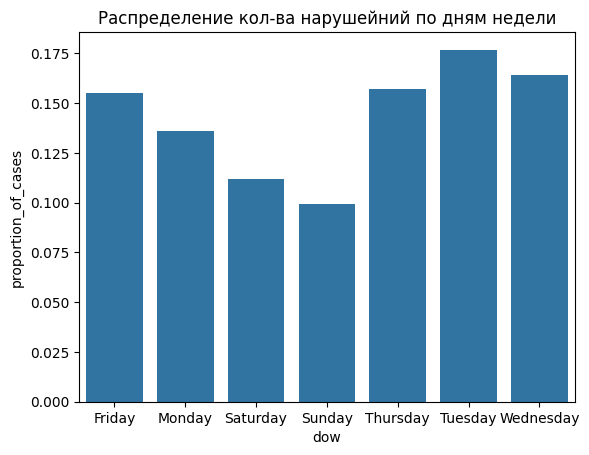

In [61]:
tmp = df.groupby('dow', as_index=False).agg(proportion_of_cases=('Latitude', pd.Series.count))
tmp.proportion_of_cases = tmp.proportion_of_cases / len(df)
sns.barplot(tmp, x='dow', y='proportion_of_cases')
plt.title('Распределение кол-ва нарушейний по дням недели')

In [62]:
ct = df['dow'].value_counts().sort_index()
chi2, p = stats.chisquare(ct)

n = ct.sum()
cohens_w = np.sqrt(chi2 / n)

print('chi2:, ', chi2)
print('p: ', p)
print('cohens_w: ', cohens_w)
ct/ct.sum()

chi2:,  71446.00234418045
p:  0.0
cohens_w:  0.1846149687035379


dow
Friday       0.155035
Monday       0.136090
Saturday     0.111726
Sunday       0.099258
Thursday     0.156908
Tuesday      0.176824
Wednesday    0.164158
Name: count, dtype: float64

Различия статзначимы, и, наконец, имеется хоть какой-то эффект

Text(0.5, 1.0, 'Распределение кол-ва нарушейний по времени суток')

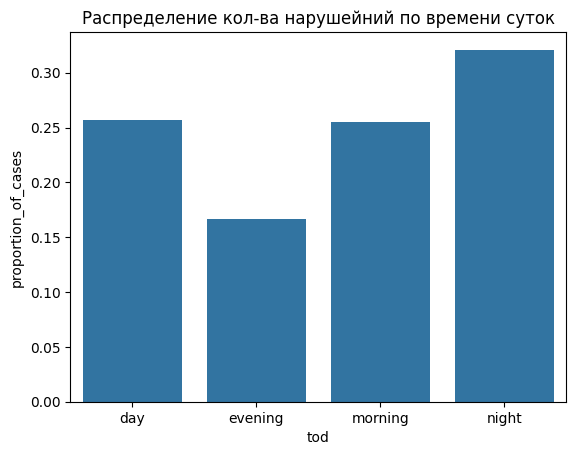

In [63]:
tmp = df.groupby('tod', as_index=False).agg(proportion_of_cases=('Latitude', pd.Series.count))
tmp.proportion_of_cases = tmp.proportion_of_cases / len(df)
sns.barplot(tmp, x='tod', y='proportion_of_cases')
plt.title('Распределение кол-ва нарушейний по времени суток')


In [64]:
ct = df['tod'].value_counts().sort_index()
chi2, p = stats.chisquare(ct)

n = ct.sum()
cohens_w = np.sqrt(chi2 / n)

print('chi2:, ', chi2)
print('p: ', p)
print('cohens_w: ', cohens_w)
ct/ct.sum()

chi2:,  100826.15683445001
p:  0.0
cohens_w:  0.21931308856002388


tod
day        0.257189
evening    0.166870
morning    0.254965
night      0.320976
Name: count, dtype: float64

Тут тоже

Text(0.5, 1.0, 'Распределение года выпуска автомобилей нарушителей')

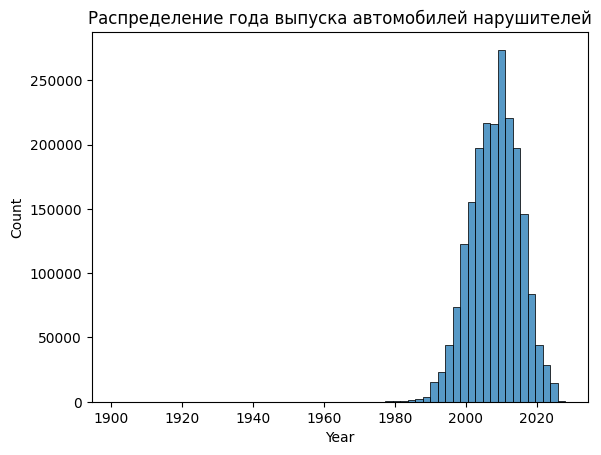

In [65]:
sns.histplot(df[(df.Year < 2030) & (df.Year > 1900)].Year, bins=60)
plt.title('Распределение года выпуска автомобилей нарушителей')

Проверим, какие факторы взаимосвязаны с обыском

In [66]:
tmp = df[['Accident', 'Belts', 'Alcohol', 'Race', 'Gender', 'dow', 'tod', 'Search Conducted', 'Violation Type']]
tmp.columns = list(map(lambda x: x.replace(' ', '_').lower(), tmp.columns))

In [67]:
tmp.isna().sum()

accident            0
belts               0
alcohol             0
race                0
gender              0
dow                 0
tod                 0
search_conducted    0
violation_type      0
dtype: int64

In [68]:
tmp[['accident', 'belts', 'alcohol']] = tmp[['accident', 'belts', 'alcohol']].astype('str')

In [69]:
df.Alcohol.value_counts()

Alcohol
0    2093632
1       2623
Name: count, dtype: int64

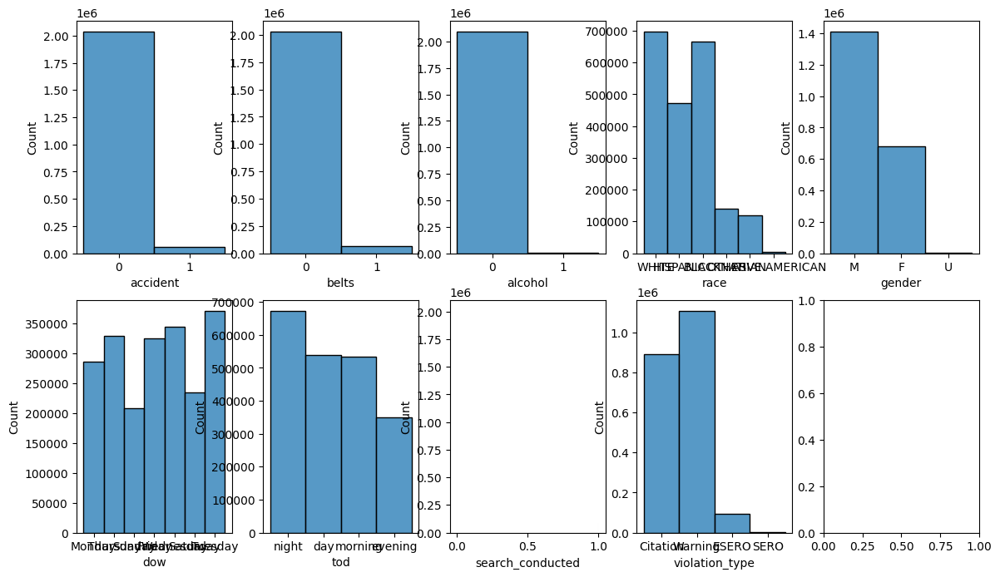

In [70]:
fig, ax = plt.subplots(2, 5, figsize=(14, 8))
for i, col in enumerate(tmp.columns):
    sns.histplot(tmp[col], ax=ax[i//5, i%5])

Убираем алкоголь, там очень мало значний, убираем коренных американцев и неизвестный пол по этой же причине, т.к. при построении логистической регрессии могут возникнуть группу с нулем объектов, что будет ломать модель.

In [71]:
tmp = tmp[tmp.race != 'NATIVE AMERICAN']
tmp = tmp[tmp.gender != 'U']

In [72]:
model = smf.logit(
    "search_conducted ~ C(accident) + C(race) + C(gender) + C(dow) + C(tod) + C(race):C(gender)",
    data=tmp
).fit()
model.summary()

Optimization terminated successfully.
         Current function value: 0.160975
         Iterations 9


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:       search_conducted   No. Observations:              2089101
Model:                          Logit   Df Residuals:                  2089081
Method:                           MLE   Df Model:                           19
Date:                Wed, 11 Mar 2026   Pseudo R-squ.:                 0.09379
Time:                        12:23:14   Log-Likelihood:            -3.3629e+05
converged:                       True   LL-Null:                   -3.7110e+05
Covariance Type:            nonrobust   LLR p-value:                     0.000
======================================================================================================
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                             -5.1416      0.050   -103.303      0.000      -5.239      -5.044
C(accident)[T.1]                       0.5968      0.016     36.377      0.000       0.565       0.629
C(race)[T.BLACK]                       0.8991      0.050     17.918      0.000       0.801       0.997
C(race)[T.HISPANIC]                    0.8604      0.052     16.524      0.000       0.758       0.962
C(race)[T.OTHER]                       0.0775      0.069      1.129      0.259      -0.057       0.212
C(race)[T.WHITE]                       0.8623      0.050     17.153      0.000       0.764       0.961
C(gender)[T.M]                         0.8947      0.054     16.709      0.000       0.790       1.000
C(dow)[T.Monday]                      -0.1471      0.014    -10.734      0.000      -0.174      -0.120
C(dow)[T.Saturday]                     0.1477      0.012     12.177      0.000       0.124       0.171
C(dow)[T.Sunday]                       0.2728      0.012     22.283      0.000       0.249       0.297
C(dow)[T.Thursday]                    -0.0979      0.013     -7.669      0.000      -0.123      -0.073
C(dow)[T.Tuesday]                     -0.2224      0.013    -17.110      0.000      -0.248      -0.197
C(dow)[T.Wednesday]                   -0.1291      0.013    -10.083      0.000      -0.154      -0.104
C(tod)[T.evening]                      0.7156      0.013     56.418      0.000       0.691       0.740
C(tod)[T.morning]                     -0.6508      0.017    -39.184      0.000      -0.683      -0.618
C(tod)[T.night]                        1.3298      0.011    124.143      0.000       1.309       1.351
C(race)[T.BLACK]:C(gender)[T.M]       -0.0133      0.056     -0.240      0.810      -0.122       0.095
C(race)[T.HISPANIC]:C(gender)[T.M]    -0.0274      0.057     -0.478      0.632      -0.140       0.085
C(race)[T.OTHER]:C(gender)[T.M]       -0.2409      0.076     -3.170      0.002      -0.390      -0.092
C(race)[T.WHITE]:C(gender)[T.M]       -0.4464      0.056     -7.988      0.000      -0.556      -0.337
======================================================================================================
"""

Модель объясняет примерно 9% вариации. Это говорит о том, что существует много ненаблюдаемых факторов и интерпретировать данные надо осторожно.

intercept: friday acciden=0 race=asian gender=f tod=day

Авария повышает шанс обыска в $e^{coef} = 1.82$ раза. Мужчин обыскивают в 2.5 раза чаще. Все расы(кроме категории other) помимо азиатов в 2.3 раза чаще при прочих равных. Но самым сильный фактор - ночь. Вероятность обыска ночью выше 3.7 раза чем у intercept модели.

In [73]:
tmp['citation'] = (tmp.violation_type == 'Citation').astype(int)

In [74]:
model = smf.logit(
    "citation ~ C(accident) + C(race) + C(gender) + C(dow) + C(tod) + C(alcohol) + C(belts)",
    data=tmp
).fit()
model.summary()

Optimization terminated successfully.
         Current function value: 0.656023
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:               citation   No. Observations:              2089101
Model:                          Logit   Df Residuals:                  2089083
Method:                           MLE   Df Model:                           17
Date:                Wed, 11 Mar 2026   Pseudo R-squ.:                 0.03868
Time:                        12:23:53   Log-Likelihood:            -1.3705e+06
converged:                       True   LL-Null:                   -1.4256e+06
Covariance Type:            nonrobust   LLR p-value:                     0.000
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept              -0.8646      0.008   -111.054      0.000      -0.880      -0.849
C(accident)[T.1]        2.7757      0.016    177.795      0.000       2.745       2.806
C(race)[T.BLACK]        0.3588      0.007     53.208      0.000       0.346       0.372
C(race)[T.HISPANIC]     0.5539      0.007     79.831      0.000       0.540       0.567
C(race)[T.OTHER]        0.0057      0.009      0.672      0.502      -0.011       0.022
C(race)[T.WHITE]        0.2170      0.007     32.214      0.000       0.204       0.230
C(gender)[T.M]          0.2924      0.003     93.516      0.000       0.286       0.299
C(dow)[T.Monday]       -0.0787      0.005    -14.752      0.000      -0.089      -0.068
C(dow)[T.Saturday]      0.1531      0.006     27.268      0.000       0.142       0.164
C(dow)[T.Sunday]        0.1564      0.006     26.895      0.000       0.145       0.168
C(dow)[T.Thursday]     -0.0418      0.005     -8.157      0.000      -0.052      -0.032
C(dow)[T.Tuesday]      -0.1478      0.005    -29.489      0.000      -0.158      -0.138
C(dow)[T.Wednesday]    -0.0814      0.005    -16.023      0.000      -0.091      -0.071
C(tod)[T.evening]      -0.1379      0.005    -30.205      0.000      -0.147      -0.129
C(tod)[T.morning]      -0.0591      0.004    -14.647      0.000      -0.067      -0.051
C(tod)[T.night]         0.1338      0.004     34.646      0.000       0.126       0.141
C(alcohol)[T.1]         3.0247      0.081     37.195      0.000       2.865       3.184
C(belts)[T.1]           0.4931      0.008     59.013      0.000       0.477       0.509
=======================================================================================
"""

intercept: accident=0 race=asian gender=F dow=friday tod=day belts=0 alcohol=0

Сильнее всего на штраф влияют: Авария увеличивает шанс получения штрафа в 14 раз, алкоголь в 20 раз и непрестегнутый ремень безопасности в 1.6 раза.

In [75]:
tmp.accident = tmp.accident.astype(int)

In [76]:
model = smf.logit(
    "accident ~ C(dow) + C(tod) + C(alcohol)",
    data=tmp
).fit()
model.summary()

Optimization terminated successfully.
         Current function value: 0.124157
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:               accident   No. Observations:              2089101
Model:                          Logit   Df Residuals:                  2089090
Method:                           MLE   Df Model:                           10
Date:                Wed, 11 Mar 2026   Pseudo R-squ.:                 0.01072
Time:                        12:24:15   Log-Likelihood:            -2.5938e+05
converged:                       True   LL-Null:                   -2.6219e+05
Covariance Type:            nonrobust   LLR p-value:                     0.000
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept              -3.4987      0.013   -268.933      0.000      -3.524      -3.473
C(dow)[T.Monday]       -0.0155      0.016     -0.964      0.335      -0.047       0.016
C(dow)[T.Saturday]      0.3767      0.016     24.192      0.000       0.346       0.407
C(dow)[T.Sunday]        0.5561      0.015     36.244      0.000       0.526       0.586
C(dow)[T.Thursday]     -0.0643      0.016     -4.090      0.000      -0.095      -0.033
C(dow)[T.Tuesday]      -0.2848      0.016    -17.725      0.000      -0.316      -0.253
C(dow)[T.Wednesday]    -0.1859      0.016    -11.616      0.000      -0.217      -0.155
C(tod)[T.evening]       0.1282      0.012     10.392      0.000       0.104       0.152
C(tod)[T.morning]      -0.2680      0.012    -21.690      0.000      -0.292      -0.244
C(tod)[T.night]        -0.2339      0.011    -20.655      0.000      -0.256      -0.212
C(alcohol)[T.1]         1.1215      0.073     15.444      0.000       0.979       1.264
=======================================================================================
"""

Больше всего на вероятность аварии влияет алкоголь. Также в выходные дни шанс попасть в аварию чуть выше.

Text(0.5, 0.98, 'Кол-во нарушений во времени в разбивке по полу')

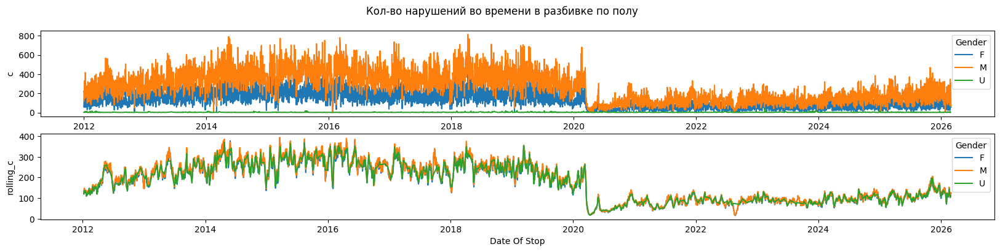

In [77]:
fig, ax = plt.subplots(2, 1, figsize=(20, 4))
tmp = df.groupby(['Date Of Stop', 'Gender'], as_index=False).agg(c=('SubAgency', pd.Series.count))
sns.lineplot(data=tmp.sort_values('Date Of Stop'), x='Date Of Stop', y='c', hue='Gender', ax=ax[0])
tmp['rolling_c'] = tmp.c.rolling(20).mean()
sns.lineplot(data=tmp.sort_values('Date Of Stop'), x='Date Of Stop', y='rolling_c', hue='Gender', ax=ax[1])
plt.suptitle('Кол-во нарушений во времени в разбивке по полу')

Text(0.5, 0.98, 'Кол-во нарушений во времени в разбивке по расе')

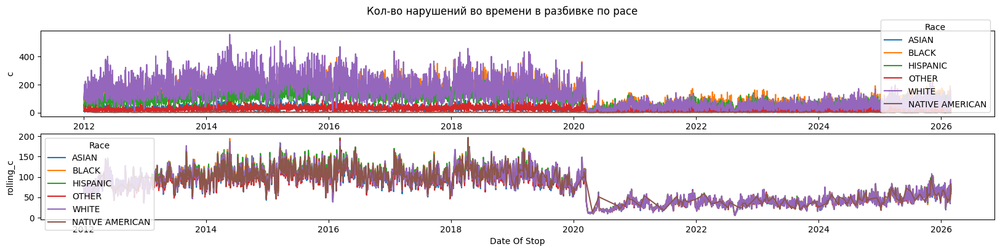

In [78]:
fig, ax = plt.subplots(2, 1, figsize=(20, 4))
tmp = df.groupby(['Date Of Stop', 'Race'], as_index=False).agg(c=('SubAgency', pd.Series.count))
sns.lineplot(data=tmp.sort_values('Date Of Stop'), x='Date Of Stop', y='c', hue='Race', ax=ax[0])
tmp['rolling_c'] = tmp.c.rolling(20).mean()
sns.lineplot(data=tmp.sort_values('Date Of Stop'), x='Date Of Stop', y='rolling_c', hue='Race', ax=ax[1])
plt.suptitle('Кол-во нарушений во времени в разбивке по расе')

В первом квартале 20 года случился ковид. После снятия ограничений, тренд, конечно, имеется, но удивительно, что кол-во нарушений растет очень медленно.

(array([18324., 18326., 18328., 18330., 18332., 18334., 18336., 18338.,
        18340.]),
 [Text(18324.0, 0, '2020-03-03'),
  Text(18326.0, 0, '2020-03-05'),
  Text(18328.0, 0, '2020-03-07'),
  Text(18330.0, 0, '2020-03-09'),
  Text(18332.0, 0, '2020-03-11'),
  Text(18334.0, 0, '2020-03-13'),
  Text(18336.0, 0, '2020-03-15'),
  Text(18338.0, 0, '2020-03-17'),
  Text(18340.0, 0, '2020-03-19')])

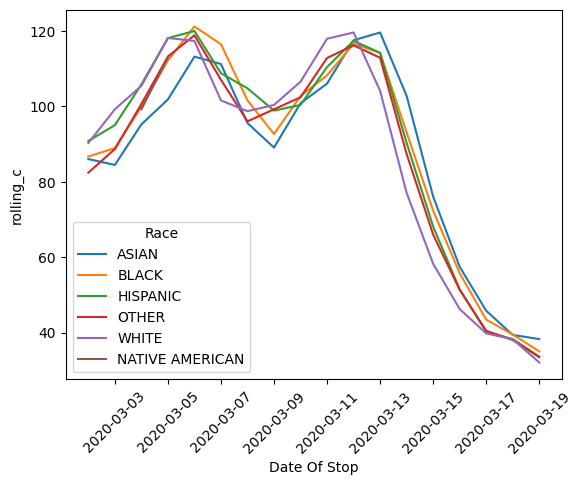

In [79]:
tmp = tmp[(tmp['Date Of Stop'] < '2020-03-20') & (tmp['Date Of Stop'] > '2020-03-01')]
sns.lineplot(data=tmp.sort_values('Date Of Stop'), x='Date Of Stop', y='rolling_c', hue='Race')
plt.xticks(rotation=45)

In [80]:
df['postcovid'] = df['Date Of Stop'] > '2020-03-15'

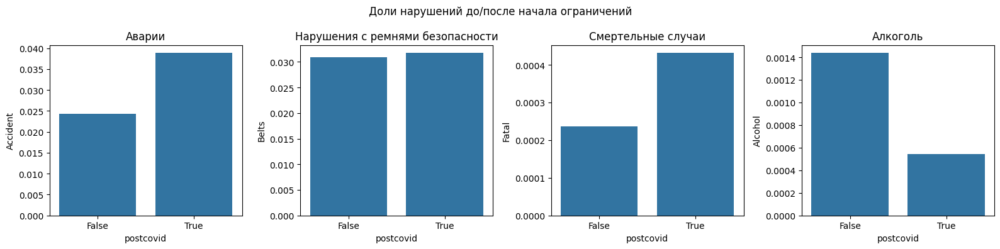

In [81]:
fig, ax = plt.subplots(1, 4, figsize=(16, 4))

sns.barplot(data=df.groupby('postcovid').Accident.mean(), ax=ax[0])
ax[0].set_title('Аварии')
sns.barplot(data=df.groupby('postcovid').Belts.mean(), ax=ax[1])
ax[1].set_title('Нарушения с ремнями безопасности')
sns.barplot(data=df.groupby('postcovid').Fatal.mean(), ax=ax[2])
ax[2].set_title('Смертельные случаи')
sns.barplot(data=df.groupby('postcovid').Alcohol.mean(), ax=ax[3])
ax[3].set_title('Алкоголь')
plt.suptitle('Доли нарушений до/после начала ограничений')
plt.tight_layout()

К следующим тестам надо отноститься с осторожностью, ведь, возможно, после наступления ковида изменилась методика, стали чаще закрывать глаза на мелкие нарушения и тп, из-за чего могли поменяться доли. Факторов может быть много и не факт, что ковид-основной.

In [82]:
ct = pd.crosstab(df.postcovid, df.Accident)
chi2, p, dof, expected = stats.chi2_contingency(ct)
cramers = cramers_v(ct, chi2)

print('chi2: ', chi2)
print('p: ', p)
print('cranmers_v: ', cramers)
pd.crosstab(df.postcovid, df.Accident, normalize='index')

chi2:  2697.746222599222
p:  0.0
cranmers_v:  0.0358738915426752


Accident,0,1
postcovid,,
False,0.975632,0.024368
True,0.961186,0.038814


Люди стали статзначимо чаще попадать в аварии после ковида, или просто стали меньше фиксировать остальных случаев (не аварийных)

In [83]:
ct = pd.crosstab(df.postcovid, df.Belts)
chi2, p, dof, expected = stats.chi2_contingency(ct)
cramers = cramers_v(ct, chi2)

print('chi2: ', chi2)
print('p: ', p)
print('cranmers_v: ', cramers)
pd.crosstab(df.postcovid, df.Belts, normalize='index')

chi2:  6.945639934475639
p:  0.008402377351995345
cranmers_v:  0.0018202627301494008


Belts,0,1
postcovid,,
False,0.969085,0.030915
True,0.968304,0.031696


Доля непрестегнутых водителей выросла, но размер эффекта очень маленький.

In [84]:
ct = pd.crosstab(df.postcovid, df.Fatal)
chi2, p, dof, expected = stats.chi2_contingency(ct)
cramers = cramers_v(ct, chi2)

print('chi2: ', chi2)
print('p: ', p)
print('cranmers_v: ', cramers)
pd.crosstab(df.postcovid, df.Fatal, normalize='index')

chi2:  46.05087626775455
p:  1.1522159942456343e-11
cranmers_v:  0.004687020936619723


Fatal,0,1
postcovid,,
False,0.999763,0.000237
True,0.999569,0.000431


Доля ситуаций со смертельным исходом выросла, но размер эффекта очень маленький.

In [85]:
ct = pd.crosstab(df.postcovid, df.Alcohol)
chi2, p, dof, expected = stats.chi2_contingency(ct)
cramers = cramers_v(ct, chi2)

print('chi2: ', chi2)
print('p: ', p)
print('cranmers_v: ', cramers)

pd.crosstab(df.postcovid, df.Alcohol, normalize='index')

chi2:  219.70188453034578
p:  1.0505346284658392e-49
cranmers_v:  0.010237521700324935


Alcohol,0,1
postcovid,,
False,0.998564,0.001436
True,0.999458,0.000542


Ну и доля пьяных водителей уменьшилась, но размер эффекта очень маленький

Все-таки, как мне кажется, стали чаще не замечать случаи, которые не повлекли за собой тяжких последствий, что повлияло на метрики "до" и "после".

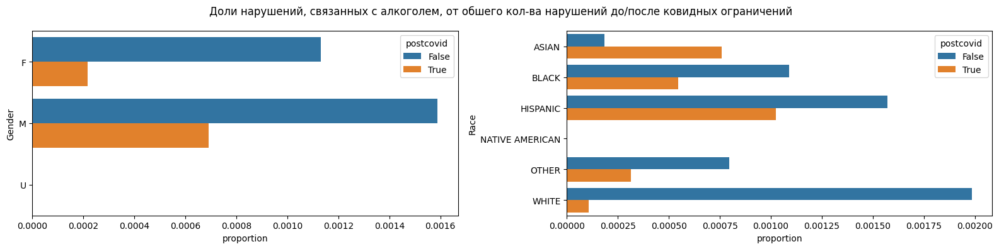

In [86]:
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
sns.barplot(data=df[['Alcohol', 'Gender', 'postcovid']].groupby(['Gender', 'postcovid']).agg(proportion=('Alcohol', pd.Series.mean)), y='Gender', x='proportion', hue='postcovid', ax=ax[0])
sns.barplot(data=df[['Alcohol', 'Race', 'postcovid']].groupby(['Race', 'postcovid']).agg(proportion=('Alcohol', pd.Series.mean)), y='Race', x='proportion', hue='postcovid', ax=ax[1])
plt.suptitle('Доли нарушений, связанных с алкоголем, от обшего кол-ва нарушений до/после ковидных ограничений')
plt.tight_layout()

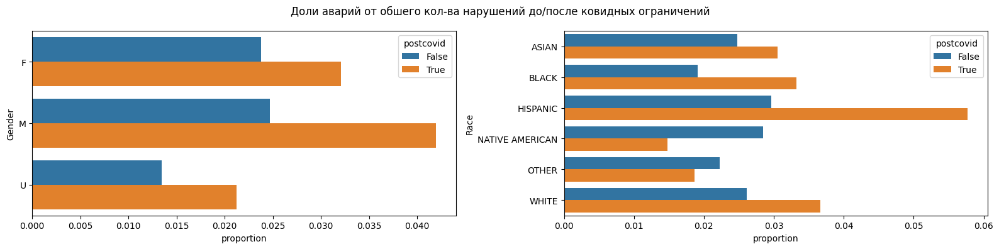

In [87]:
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
sns.barplot(data=df[['Accident', 'Gender', 'postcovid']].groupby(['Gender', 'postcovid']).agg(proportion=('Accident', pd.Series.mean)), y='Gender', x='proportion', hue='postcovid', ax=ax[0])
sns.barplot(data=df[['Accident', 'Race', 'postcovid']].groupby(['Race', 'postcovid']).agg(proportion=('Accident', pd.Series.mean)), y='Race', x='proportion', hue='postcovid', ax=ax[1])
plt.suptitle('Доли аварий от обшего кол-ва нарушений до/после ковидных ограничений')
plt.tight_layout()

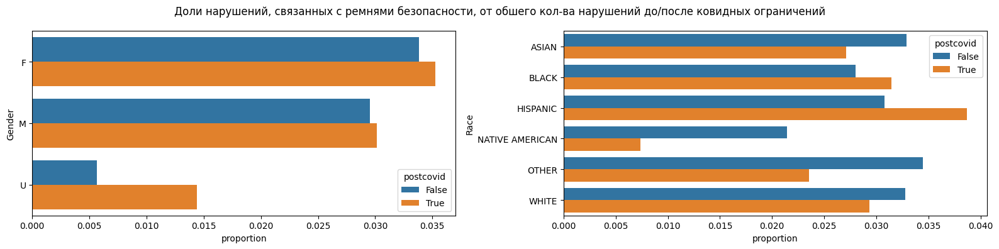

In [88]:
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
sns.barplot(data=df[['Belts', 'Gender', 'postcovid']].groupby(['Gender', 'postcovid']).agg(proportion=('Belts', pd.Series.mean)), y='Gender', x='proportion', hue='postcovid', ax=ax[0])
sns.barplot(data=df[['Belts', 'Race', 'postcovid']].groupby(['Race', 'postcovid']).agg(proportion=('Belts', pd.Series.mean)), y='Race', x='proportion', hue='postcovid', ax=ax[1])
plt.suptitle('Доли нарушений, связанных с ремнями безопасности, от обшего кол-ва нарушений до/после ковидных ограничений')
plt.tight_layout()

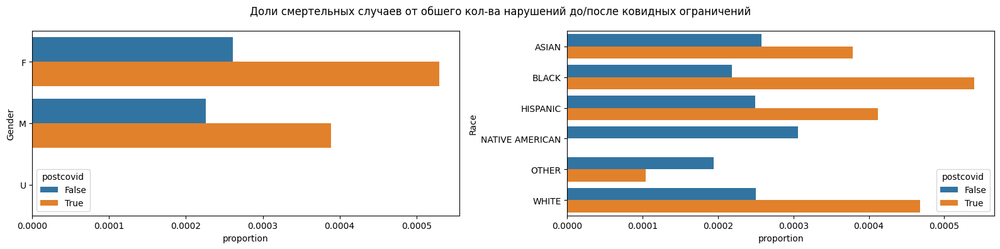

In [89]:
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
sns.barplot(data=df[['Fatal', 'Gender', 'postcovid']].groupby(['Gender', 'postcovid']).agg(proportion=('Fatal', pd.Series.mean)), y='Gender', x='proportion', hue='postcovid', ax=ax[0])
sns.barplot(data=df[['Fatal', 'Race', 'postcovid']].groupby(['Race', 'postcovid']).agg(proportion=('Fatal', pd.Series.mean)), y='Race', x='proportion', hue='postcovid', ax=ax[1])
plt.suptitle('Доли смертельных случаев от обшего кол-ва нарушений до/после ковидных ограничений')
plt.tight_layout()

In [90]:
tmp = df[['quarter', 'postcovid', 'Latitude']].groupby(['quarter', 'postcovid'], as_index=False).agg(proportion=('Latitude', pd.Series.count))
tmp.proportion = tmp.proportion / tmp.groupby('postcovid').proportion.transform('sum')

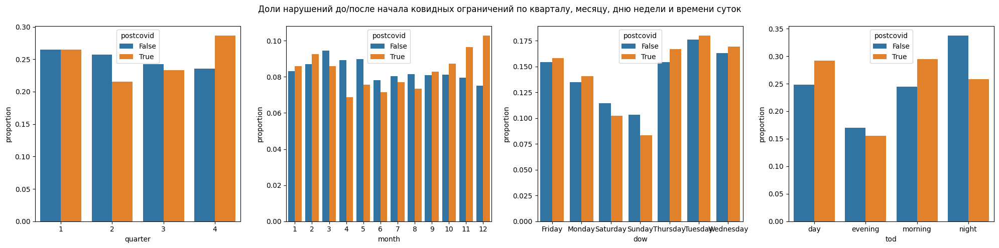

In [91]:
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
tmp = df[['quarter', 'postcovid', 'Latitude']].groupby(['quarter', 'postcovid'], as_index=False).agg(proportion=('Latitude', pd.Series.count))
tmp.proportion = tmp.proportion / tmp.groupby('postcovid').proportion.transform('sum')
sns.barplot(data=tmp, x='quarter', y='proportion', hue='postcovid', ax = ax[0])

tmp = df[['month', 'postcovid', 'Latitude']].groupby(['month', 'postcovid'], as_index=False).agg(proportion=('Latitude', pd.Series.count))
tmp.proportion = tmp.proportion / tmp.groupby('postcovid').proportion.transform('sum')
sns.barplot(data=tmp, x='month', y='proportion', hue='postcovid', ax = ax[1])

tmp = df[['dow', 'postcovid', 'Latitude']].groupby(['dow', 'postcovid'], as_index=False).agg(proportion=('Latitude', pd.Series.count))
tmp.proportion = tmp.proportion / tmp.groupby('postcovid').proportion.transform('sum')
sns.barplot(data=tmp, x='dow', y='proportion', hue='postcovid', ax = ax[2])

tmp = df[['tod', 'postcovid', 'Latitude']].groupby(['tod', 'postcovid'], as_index=False).agg(proportion=('Latitude', pd.Series.count))
tmp.proportion = tmp.proportion / tmp.groupby('postcovid').proportion.transform('sum')
sns.barplot(data=tmp, x='tod', y='proportion', hue='postcovid', ax = ax[3])
plt.suptitle('Доли нарушений до/после начала ковидных ограничений по кварталу, месяцу, дню недели и времени суток')

plt.tight_layout()

В постковидное время в четвертом квартале года наблюдается повышение нарушений.

Координаты:

In [92]:
df[df.Longitude == 0]

,Date Of Stop,Time Of Stop,SubAgency,Latitude,Longitude,Accident,Belts,Personal Injury,Property Damage,Fatal,Commercial License,HAZMAT,Commercial Vehicle,Alcohol,Work Zone,Search Conducted,Search Outcome,Search Reason For Stop,State,VehicleType,Year,Color,Violation Type,Article,Contributed To Accident,Race,Gender,Driver State,DL State,Arrest Type,arrest_type,quarter,month,dow,tod,postcovid
0,2023-05-01,23:11:00,"3rd District, Silver Spring",0.0,0.0,0,0,No,No,0,No,No,No,0,No,0,Citation,17-107(a1),MD,02 - Automobile,2007.0,BLACK,Citation,Transportation Article,False,WHITE,M,MD,MD,A - Marked Patrol,A,2,5,Monday,night,True
26,2023-04-30,10:43:00,"3rd District, Silver Spring",0.0,0.0,0,1,No,No,0,No,No,No,0,No,0,Citation,13-411(g),XX,02 - Automobile,2002.0,GRAY,Citation,Transportation Article,False,BLACK,M,MD,MD,A - Marked Patrol,A,2,4,Sunday,morning,True
27,2023-04-30,10:43:00,"3rd District, Silver Spring",0.0,0.0,0,1,No,No,0,No,No,No,0,No,0,Citation,13-411(g),XX,02 - Automobile,2002.0,GRAY,Citation,Transportation Article,False,BLACK,M,MD,MD,A - Marked Patrol,A,2,4,Sunday,morning,True
28,2023-04-30,10:43:00,"3rd District, Silver Spring",0.0,0.0,0,1,No,No,0,No,No,No,0,No,0,Citation,13-411(g),XX,02 - Automobile,2002.0,GRAY,Citation,Transportation Article,False,BLACK,M,MD,MD,A - Marked Patrol,A,2,4,Sunday,morning,True
29,2023-04-30,10:43:00,"3rd District, Silver Spring",0.0,0.0,0,1,No,No,0,No,No,No,0,No,0,Citation,13-411(g),XX,02 - Automobile,2002.0,GRAY,Citation,Transportation Article,False,BLACK,M,MD,MD,A - Marked Patrol,A,2,4,Sunday,morning,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2096225,2026-02-28,20:11:00,"3rd District, Silver Spring",0.0,0.0,0,0,No,No,0,No,No,No,0,No,0,NaN,NaN,VA,02 - Automobile,2023.0,BLACK,Warning,Transportation Article,False,OTHER,F,VA,VA,A - Marked Patrol,A,1,2,Saturday,evening,True
2096229,2026-02-28,09:19:00,"2nd District, Bethesda",0.0,0.0,0,0,No,No,0,No,No,No,0,No,0,Warning,21-1003(e),VA,02 - Automobile,2015.0,GRAY,Warning,Transportation Article,False,HISPANIC,M,DC,DC,A - Marked Patrol,A,1,2,Saturday,morning,True
2096233,2026-02-28,23:48:00,"3rd District, Silver Spring",0.0,0.0,0,0,No,No,0,No,No,No,0,No,0,Warning,21-202(h1),MD,02 - Automobile,2020.0,BLACK,Warning,Transportation Article,False,BLACK,M,MD,MD,A - Marked Patrol,A,1,2,Saturday,night,True
2096234,2026-02-28,16:22:00,"4th District, Wheaton",0.0,0.0,1,0,No,Yes,0,No,No,No,0,No,0,Citation,21-309(b),MD,02 - Automobile,2015.0,WHITE,Citation,Transportation Article,True,HISPANIC,M,MD,MD,A - Marked Patrol,A,1,2,Saturday,day,True


У 160 тыс. случаев не указаны координаты произошедшего нарушения.

In [ ]:

# Закоментил, чтобы тетрадка весила меньше, а то ни гитхаб не помещается )

# import folium
# from folium.plugins import HeatMap

# df = df[
#     (df["Latitude"].between(38, 40)) &
#     (df["Longitude"].between(-79, -75))
# ]

# m = folium.Map(
#     location=[df["Latitude"].mean(), df["Longitude"].mean()],
#     zoom_start=11
# )

# HeatMap(
#     df[["Latitude", "Longitude"]].dropna().values,
#     radius=8
# ).add_to(m)

# m

### Тепловая карта нарушений

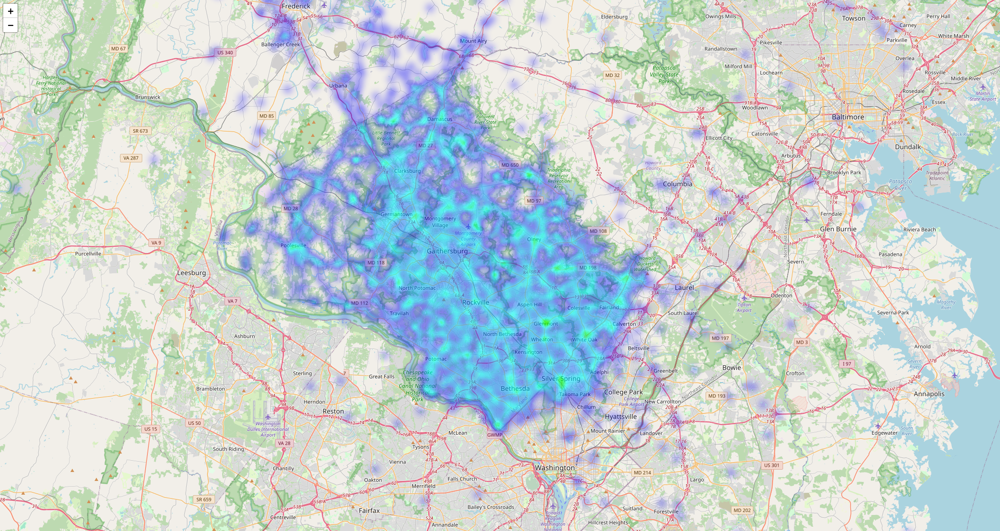

In [94]:
df['Violation Type'].value_counts()

Violation Type
Warning     1108739
Citation     893714
ESERO         92900
SERO            902
Name: count, dtype: int64

In [95]:
# import folium

# m = folium.Map(
#     location=[df["Latitude"].mean(), df["Longitude"].mean()],
#     zoom_start=11
# )

# colors = {
#     "Citation": "red",
#     "Warning": "blue",
#     "ESERO": "purple",
#     "SERO": "putple"
# }

# for _, row in df.sample(10000).iterrows():   # лучше брать sample если данных много
#     folium.CircleMarker(
#         location=[row["Latitude"], row["Longitude"]],
#         radius=2,
#         color=colors.get(row["Violation Type"], "gray"),
#         fill=True,
#         fill_opacity=0.7
#     ).add_to(m)

# m

### Карта типов наказаний за правонарушение

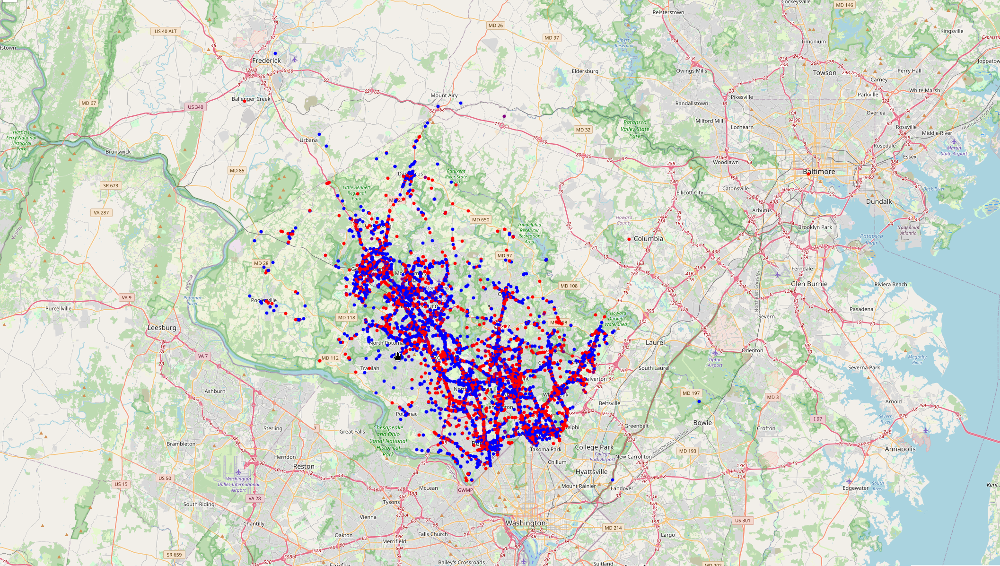

In [ ]:
# import folium

# m = folium.Map(
#     location=[df["Latitude"].mean(), df["Longitude"].mean()],
#     zoom_start=11
# )

# fatal = folium.FeatureGroup(name="Fatal")
# no = folium.FeatureGroup(name="NO")

# for _, row in df[df.Fatal==1].iterrows():
    
#     marker = folium.CircleMarker(
#         location=[row["Latitude"], row["Longitude"]],
#         radius=2,
#         fill=True,
#         fill_opacity=0.6
#     )
#     marker.add_to(fatal)

# for _, row in df[df.Fatal==0].sample(50000).iterrows():
    
#     marker = folium.CircleMarker(
#         location=[row["Latitude"], row["Longitude"]],
#         radius=2,
#         fill=True,
#         fill_opacity=0.6
#     )
#     marker.add_to(no)

# fatal.add_to(m)
# no.add_to(m)

# folium.LayerControl().add_to(m)

# m

### Карта смертельных случаев

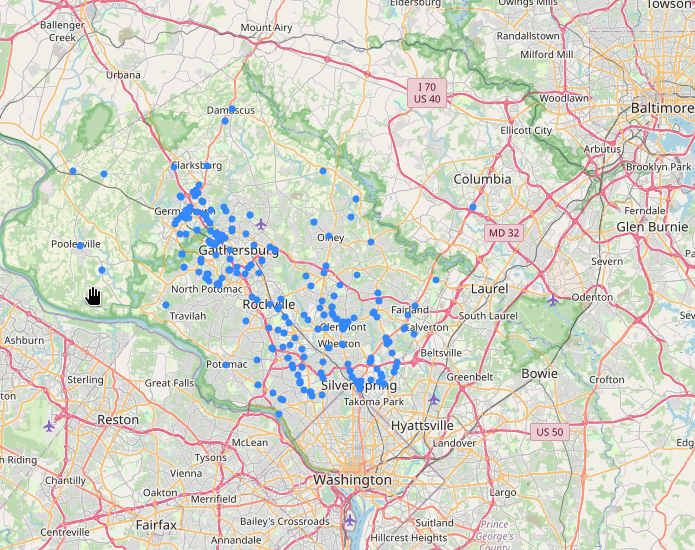

В целом, ничего особенного по картам я не вижу. +- все равномерно распределено.

В работе был проведён разведочный и статистический анализ датасета дорожных остановок с целью изучить распределение нарушений. Для анализа использовались таблицы сопряжённости, критерий $\chi^2$, коэффициент Крамера для оценки силы связи, а также логистическая регрессия.

Проверки $\chi^2$ показали наличие статистически значимых зависимостей между рядом факторов и исследуемыми переменными. Однако из-за большого размера выборки даже небольшие различия оказываются значимыми, поэтому для интерпретации учитывался размер эффекта. Значения Cramer's V в большинстве случаев оказались низкими, что указывает на слабую силу связи между переменными.

Логистическая регрессия показала, что вероятность обыска связана с несколькими факторами, включая наличие аварии, пол и раса водителя и время остановки. При этом часть взаимодействий факторов также оказалась статистически значимой. На выписывание штрафа влияют следующие факторы: авария, алкоголь в крови и непрестегнутый ремень.

Был проведен разведовательный анализ данных до и после введения ковидных ограничений.

Важно учитывать ограничение данных: датасет содержит только информацию об уже остановленных водителях. Поэтому выводы можно делать лишь о различиях внутри этой выборки, но не о поведении всей популяции водителей